# Street Network Analysis of Canada Water

## 1. Loading Libraries

In [2]:
# import all  libraries used for this project 

# Pandas for data analysis and manipulation  
import pandas as pd  

# NumPy for numerical computations, including array operations and mathematical functions  
import numpy as np  

# NetworkX for creating, manipulating, and analysing graph and network structures  
import networkx as nx  

# OSMnx for retrieving, modelling, and visualising street networks from OpenStreetMap  
import osmnx as ox  

# GeoPandas for handling geospatial data, including shapefiles and geographic coordinates  
import geopandas as gpd  

# Contextily for adding basemaps (e.g., satellite imagery, OpenStreetMap tiles) to geospatial visualisations  
import contextily as ctx  

# Matplotlib for creating static, animated, and interactive visualisations  
import matplotlib  

# Pyplot for a high-level interface to generate plots, charts, and figures in Matplotlib  
import matplotlib.pyplot as plt  

# Colormap module for managing colour mappings and gradients in visualisations  
import matplotlib.cm as cm  

# Colours module for defining and manipulating colours and colormaps in Matplotlib  
import matplotlib.colors as colors  

## 2. Loading & Preliminary Analysis of Canada Water Street Network

In [38]:
# define the location to extract the street network
location = 'Canada Water Station, London, UK'

# download the street network as a graph (set 'network_type' to drive for vehicle-accessible roads)
G=ox.graph_from_address(location, dist=2000, network_type='drive')

In [58]:
# compute basic street network statistics
stats = ox.basic_stats(G)

# extract key metrics
num_nodes = stats['n']
num_edges = stats['m']
avg_node_degree = stats['k_avg']
avg_street_length = stats['street_length_avg']
avg_streets_per_node = stats['streets_per_node_avg']
total_street_length = stats['street_length_total']
intersection_count = stats['intersection_count']
circuity_avg = stats['circuity_avg']
self_loop_proportion = stats['self_loop_proportion']

# print basic network overview
print("Basic Network Overview: \n")

print(f"Street Network has {num_nodes} nodes and {num_edges} edges, with an average of {avg_node_degree:.2f} connections per node.")
print("Each node having an average of 4.29 connections indicate a well-connected network, with many 3-way or 4-way intersections.\n")

print(f"The total street length is {total_street_length:.2f}m, with an average street segment length of {avg_street_length:.2f}m.")
print("Shorter segments (~50-70m) indicate a dense urban grid with frequent intersections.\n")

print(f"On average, each node connects to {avg_streets_per_node:.2f} streets, and there are {intersection_count} intersections in the network.")
print("2.46 unique streets pernode indicate moderate connectivity.\n")
print("The difference between avg_node_degree and avg_streets_per_node is due to "
      "duplicate edges from bi-directional streets in avg_node_degree.\n")

# print network efficiency and structure
print("\nNetwork Efficiency and Structure:\n")
print(f"The average circuity is {circuity_avg:.2f}, indicating how direct travel routes are.")
print("The value close to 1 indicates that streets follow a fairly direct path.\n")
print(f"The proportion of self-looping streets in the network is {self_loop_proportion * 100:.2f}%.")
print("The value close to 0 indicates that there are very few self-looping streets (0.23% of the network)")

Basic Network Overview: 

Street Network has 2801 nodes and 6008 edges, with an average of 4.29 connections per node.
Each node having an average of 4.29 connections indicate a well-connected network, with many 3-way or 4-way intersections.

The total street length is 217304.03m, with an average street segment length of 63.56m.
Shorter segments (~50-70m) indicate a dense urban grid with frequent intersections.

On average, each node connects to 2.47 streets, and there are 1975 intersections in the network.
2.46 unique streets pernode indicate moderate connectivity.

The difference between avg_node_degree and avg_streets_per_node is due to duplicate edges from bi-directional streets in avg_node_degree.


Network Efficiency and Structure:

The average circuity is 1.06, indicating how direct travel routes are.
The value close to 1 indicates that streets follow a fairly direct path.

The proportion of self-looping streets in the network is 0.23%.
The value close to 0 indicates that there a

## 3. Visualising Canada Water Street Network

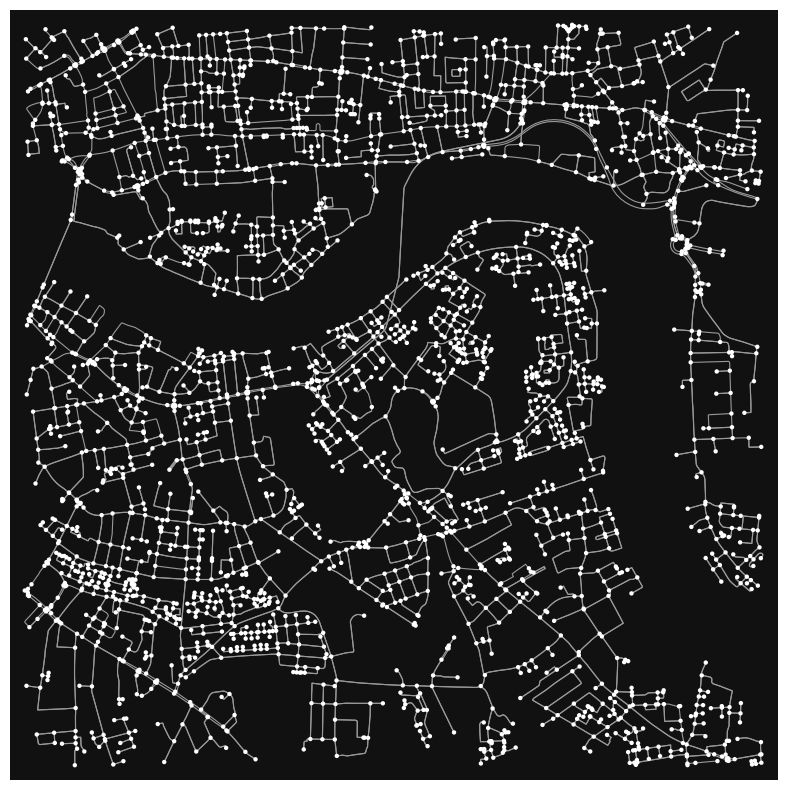

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [40]:
# plot the street graph network using plot_graph() method
ox.plot_graph(G, figsize= (10, 10), node_size = 10, edge_linewidth = 0.8)

In [59]:
# plot an interactive street graph newtork using geopandas

# convert the graph G to GeoDataFrame
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

# create and display an interactive map
base_map = gdf_edges.explore(
    color="blue",
    tiles="OpenStreetMap",
    line_width=2,
    legend=True
)

# display the interactive map
base_map

## 4. Centrality Analysis of Canada Water Street network

### 4.1. Closeness Centrality

In [66]:
# convert the street networks to a directed graph, as some centrality measures are not implemented for MultiGraph
DG = ox.convert.to_digraph(G)

In [67]:
# convert the directed graph to a line graph, so that edges become nodes - this allows us to compute edge-based centrality measures
edge_cc = nx.closeness_centrality(nx.line_graph(DG))

In [131]:
# assign edge closeness centrality values to the original graph's edges
nx.set_edge_attributes(DG,edge_cc,'cc')

# convert the directed graph back to a MultiGraph to match the original format
G1 = nx.MultiGraph(DG)

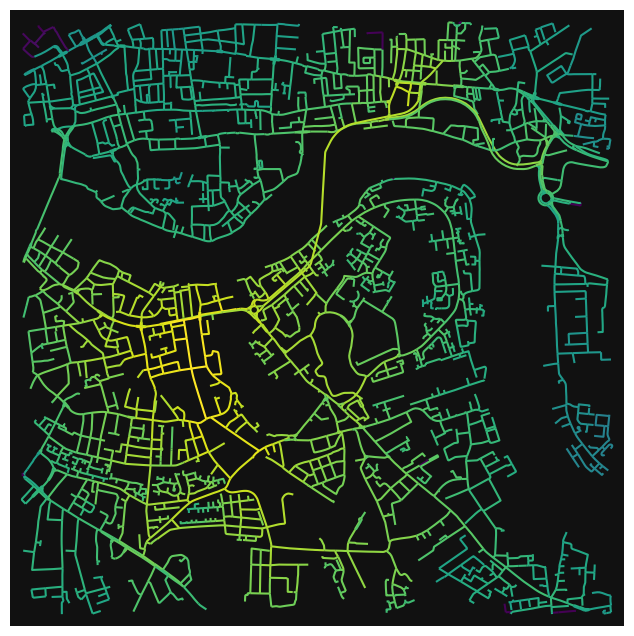

In [69]:
# generate edge colours based on closeness centrality for visualisation
edge_colours = ox.plot.get_edge_colors_by_attr(G1, 'cc', cmap='viridis')

# plot the graph and colour edges by closenss centrality
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=edge_colours, edge_linewidth=1.5, edge_alpha=1)

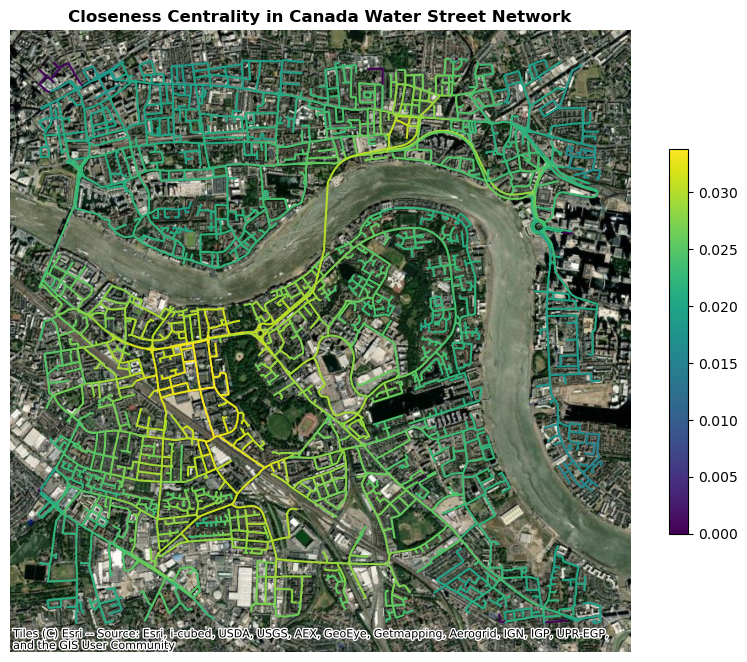

In [135]:
# convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1, nodes=False, fill_edge_geometry=True)

# reproject to EPSG:3857 (Web Mercator) for compatibility with contextily basemaps
gdf_edges = gdf_edges.to_crs(epsg=3857)

# create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# plot edges according to closeness centrality
gdf_edges.plot(
    column='cc', cmap='viridis', legend=True, ax=ax,
    legend_kwds={
        'shrink': 0.5
    }
)

# add a Esri WorldImagery satellite image basesmap
ctx.add_basemap(ax,source=ctx.providers.Esri.WorldImagery)

# add title and remove axes
plt.title("Closeness Centrality in Canada Water Street Network", weight='bold', loc='center')
plt.axis('off')
plt.show()

### 4.2. Betweenness Centrality

In [101]:
# convert the directed graph to a line graph, so that edges become nodes - this allows us to compute edge-based centrality measures
edge_bc = nx.betweenness_centrality(nx.line_graph(DG))

In [102]:
# assign edge between centrality values to the original graph's edges
nx.set_edge_attributes(DG,edge_bc,'bc')

# convert the directed graph back to a MultiGraph to match the original format
G1 = nx.MultiGraph(DG)

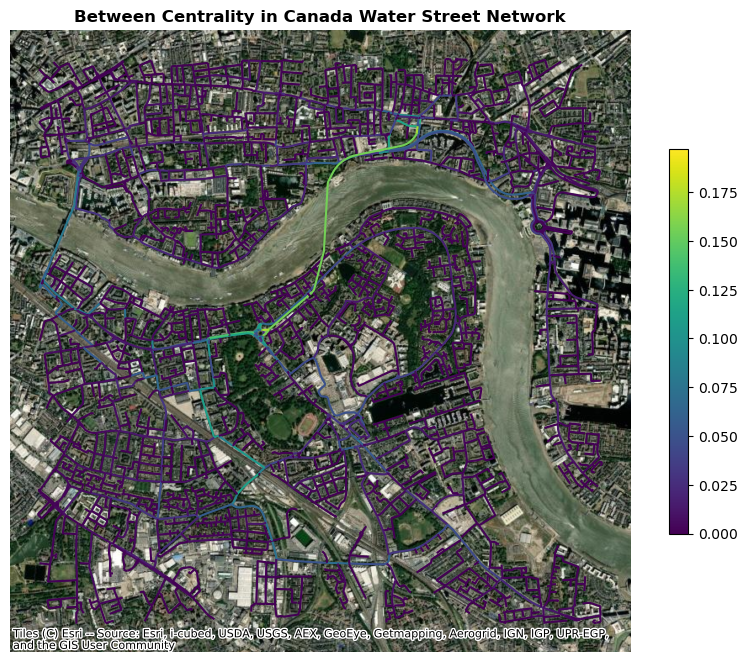

In [137]:
# convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1, nodes=False, fill_edge_geometry=True)

# reproject to EPSG:3857 (Web Mercator) for compatibility with contextily basemaps
gdf_edges = gdf_edges.to_crs(epsg=3857)

# create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# plot edges according to between centrality
gdf_edges.plot(
    column='bc', cmap='viridis', legend=True, ax=ax,
    legend_kwds={
        'shrink': 0.5
    }
)

# add a Esri WorldImagery satellite image basesmap
ctx.add_basemap(ax,source=ctx.providers.Esri.WorldImagery)

# add title and remove axes
plt.title("Between Centrality in Canada Water Street Network", weight='bold', loc='center')
plt.axis('off')
plt.show()

## 5. Urban Form / Land Use Analysis

In [105]:
# define the location to extract the street network
location = 'Canada Water Station, London, UK'

# download and extract 'landuse' and 'building' features from location
tags= tags={'landuse':True, 'building':True}
all_geom=ox.features_from_address(location, tags, dist=2000)
all_geom = all_geom.to_crs(epsg=3857)

### 5.1. Land Use

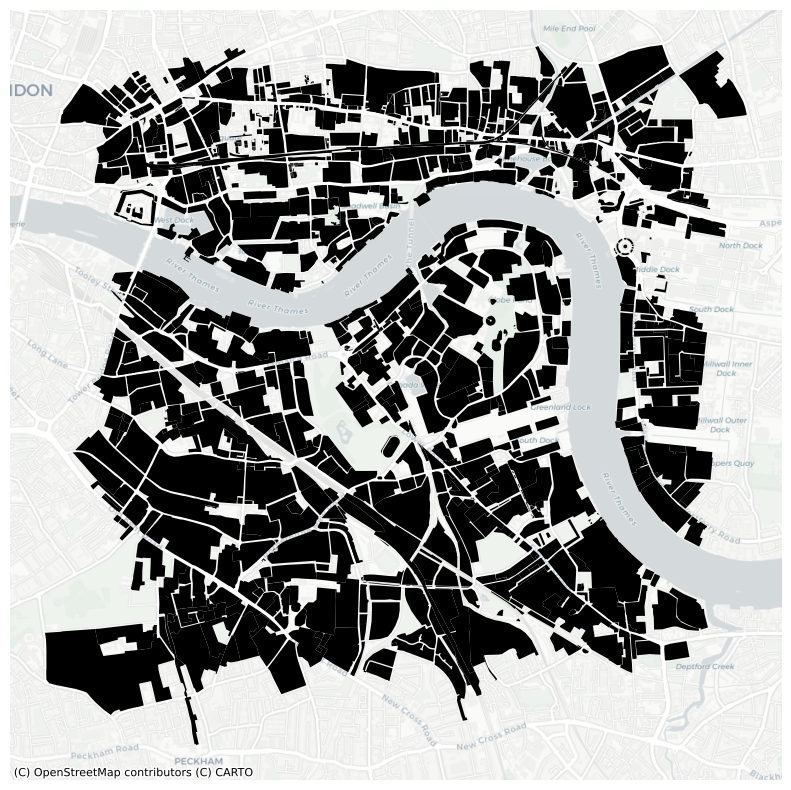

In [125]:
# create a figure and axis for plotting with a fixed size
fig,ax = plt.subplots(figsize=(10,10))

# plot all geometries where 'landuse' is not missing
all_geom[all_geom['landuse'].notna()].plot(ax=ax,color='black')

# add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# remove axis labels and display the plot
plt.axis('off')
plt.show()

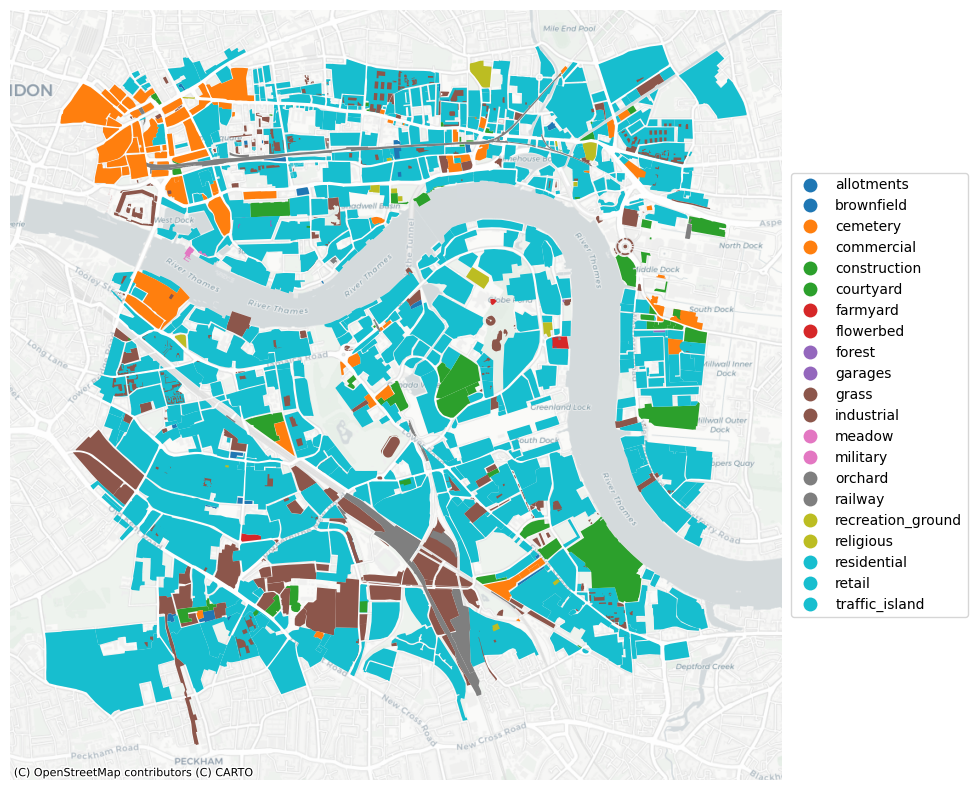

In [115]:
# create a figure and axis
fig,ax = plt.subplots(figsize=(10,10))

# plot all geometries where 'landuse' is not missing
# 'categorical=True' shows distinct colours for each land use category
all_geom[all_geom['landuse'].notna()].plot('landuse',
                                            ax=ax,
                                            categorical=True,
                                            legend=True,
                                            legend_kwds={'bbox_to_anchor': (1.25, 0.5), 'loc': 'right'})

# add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# remove axis labels
plt.axis('off')
plt.show()

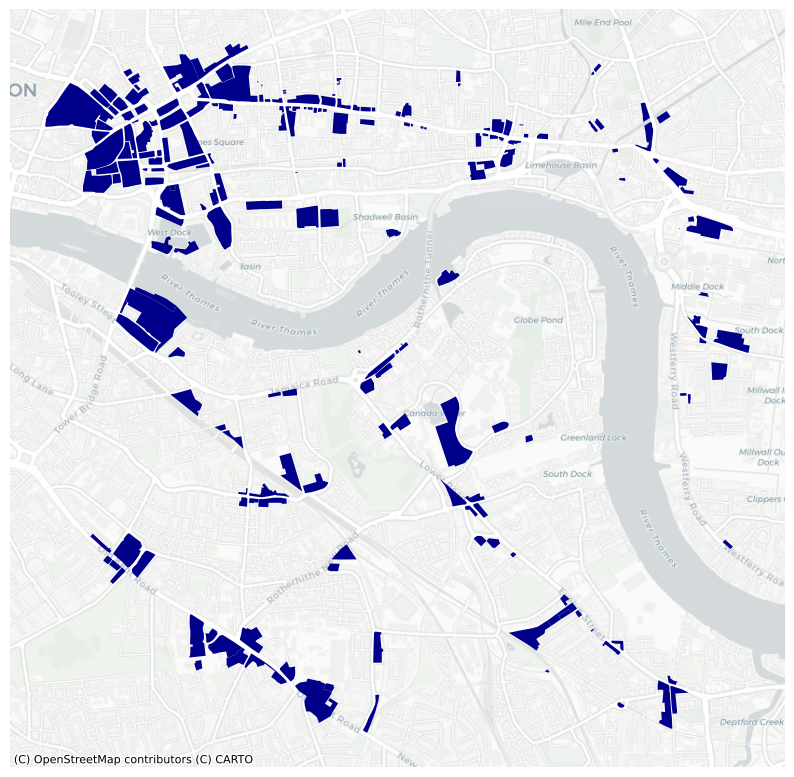

In [119]:
# create a figure and axis
fig,ax = plt.subplots(figsize=(10,10))

# filter the GeoDataFrame to include only features where 'landuse' is either 'retail' or 'commercial'
all_geom[
    all_geom['landuse'].notna() & 
    all_geom['landuse'].str.contains('retail|commercial', case=False, na=False)
].plot(ax=ax, color='darkblue')

# add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# remove axis labels and display the plot
plt.axis('off')
plt.show()

### 5.1. Buildings

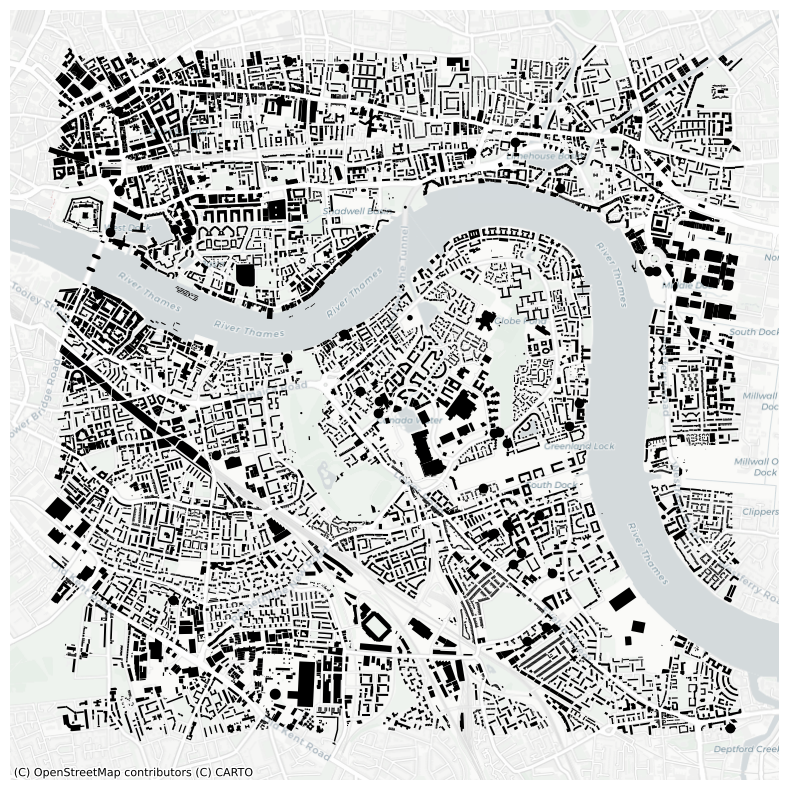

In [121]:
# create a figure and axis for plotting with a fixed size
fig,ax = plt.subplots(figsize=(10,10))

# plot all geometries where 'buildings' is not missing
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black')

# add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# remove axis labels and display the plot
plt.axis('off')
plt.show()

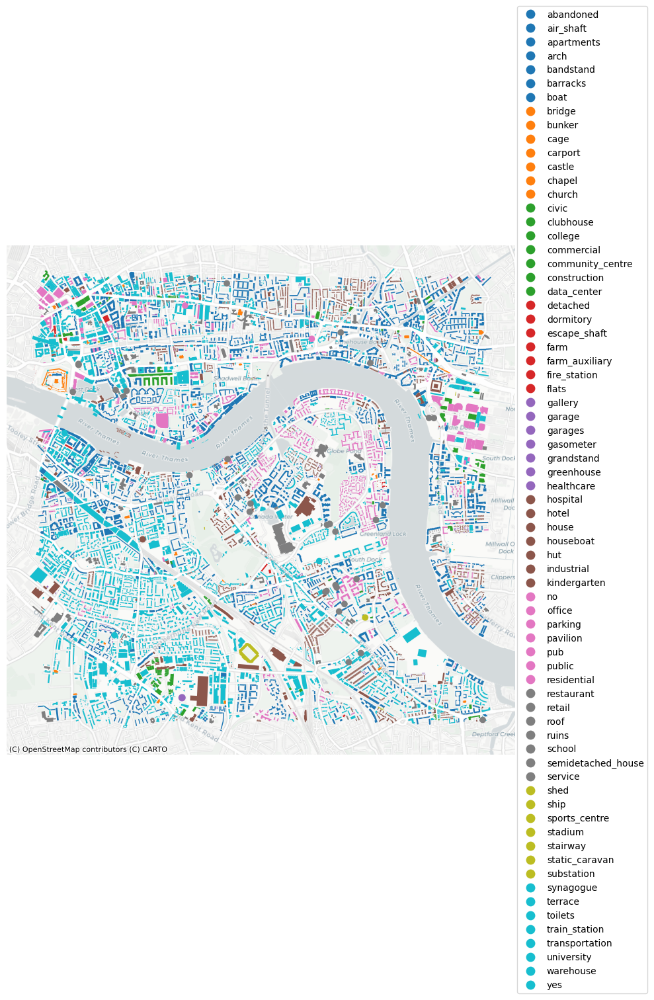

In [124]:
# create a figure and axis
fig,ax = plt.subplots(figsize=(10,10))

# plot all geometries where 'building' is not missing
# 'categorical=True' shows distinct colours for each building category
all_geom[all_geom['building'].notna()].plot('building',
                                            ax=ax,
                                            categorical=True,
                                            legend=True,
                                            legend_kwds={'bbox_to_anchor': (1.27, 0.5), 'loc': 'right'})

# add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# remove axis labels
plt.axis('off')
plt.show()

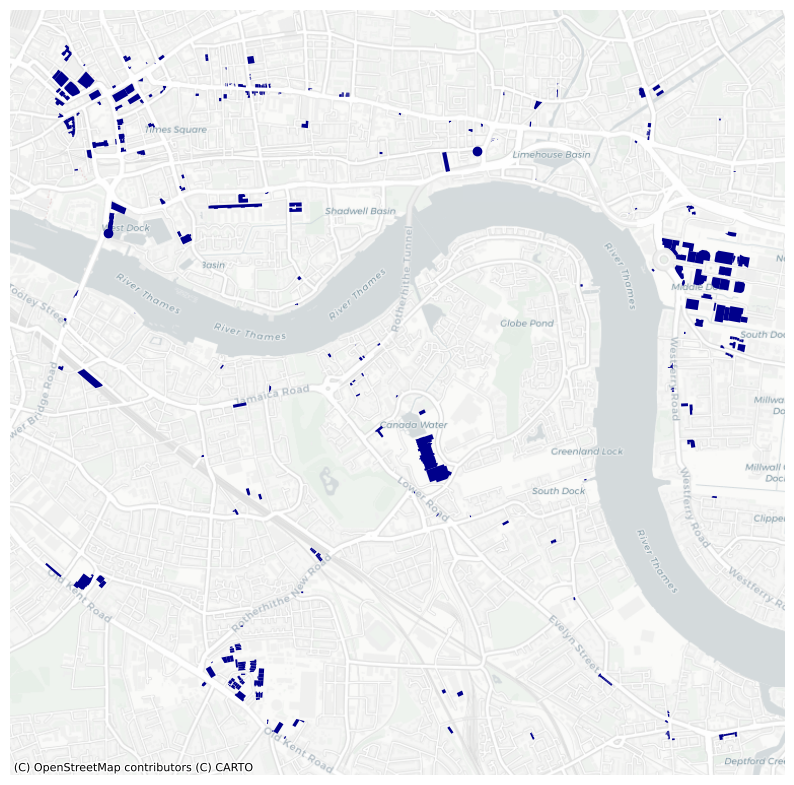

In [130]:
# create a figure and axis
fig,ax = plt.subplots(figsize=(10,10))

# filter the GeoDataFrame to include only features where 'landuse' is either 'retail' or 'commercial'
all_geom[
    all_geom['building'].notna() & 
    all_geom['building'].str.contains('retail|commercial|office', case=False, na=False)
].plot(ax=ax, color='darkblue')

# add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# remove axis labels and display the plot
plt.axis('off')
plt.show()